Note: Karena pada website github tidak support untuk membuka plot interaktif maka saya menggunakan alternatif lain yaitu dengan menggunakan NBViewer.

# Libraries

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from wordcloud import WordCloud, STOPWORDS
import folium
from folium import plugins
from scipy.stats import jarque_bera
from scipy.stats import norm,shapiro
from scipy.stats import skew,kurtosis
from geopy.geocoders import Nominatim
from urllib.request import urlopen
import json

# Data

Membaca file CSV lalu mendefinisikan dengan london_crime

In [41]:
london_crime = pd.read_csv("london_crime_by_lsoa.csv")
london_crime.head()

,lsoa_code,borough,major_category,minor_category,value,year,month
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6


Membuat salinan dari data asli dengan mendefinisikan sebagai df agar data asli tidak rusak

In [42]:
df = london_crime.copy()

Cek jika ada null value pada dataset

In [43]:
df.isnull().sum()

lsoa_code         0
borough           0
major_category    0
minor_category    0
value             0
year              0
month             0
dtype: int64

Membuat kolom baru, yaitu date dengan menggabungkan colom year dan month, lalu diubah menjadi datetime.

In [44]:
date = []
for i,j in zip(df["year"],df["month"]):
    date.append(f"{i} {j}")
df["date"] = date

df["date"] = pd.to_datetime(df["date"])

df.head()

,lsoa_code,borough,major_category,minor_category,value,year,month,date
0,E01001116,Croydon,Burglary,Burglary in Other Buildings,0,2016,11,2016-11-01
1,E01001646,Greenwich,Violence Against the Person,Other violence,0,2016,11,2016-11-01
2,E01000677,Bromley,Violence Against the Person,Other violence,0,2015,5,2015-05-01
3,E01003774,Redbridge,Burglary,Burglary in Other Buildings,0,2016,3,2016-03-01
4,E01004563,Wandsworth,Robbery,Personal Property,0,2008,6,2008-06-01


Mengurutkan data berdasarkan date, drop kolom yang tidak diperlukan, dan membuat date menjadi index

In [45]:
df = df.sort_values("date")
df = df.drop(["year","month"],axis=1)
df = df.set_index("date")
df.head()

,lsoa_code,borough,major_category,minor_category,value
date,,,,,
2008-01-01,E01000013,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2008-01-01,E01003775,Redbridge,Criminal Damage,Criminal Damage To Dwelling,0
2008-01-01,E01000274,Barnet,Drugs,Drug Trafficking,0
2008-01-01,E01001870,Hammersmith and Fulham,Violence Against the Person,Common Assault,0
2008-01-01,E01000006,Barking and Dagenham,Sexual Offences,Other Sexual,0


# Line Plot

## Berapakah selisih antara kejahatan yang terjadi pada tahun tertinggi dan pada tahun terendah?

membuat dataframe baru, yaitu sum_per_year yang berisi jumlah kejahatan per tahun

In [46]:
sum_per_year = df.resample("Y").sum()[["value"]]
sum_per_year

,value
date,
2008-12-31,738641
2009-12-31,717214
2010-12-31,715324
2011-12-31,724915
2012-12-31,737329
2013-12-31,686407
2014-12-31,680183
2015-12-31,711624
2016-12-31,736121


Membuat line plot untuk memvisualisasikan jumlah kejahatan per tahun dengan menggunakan matplotlib

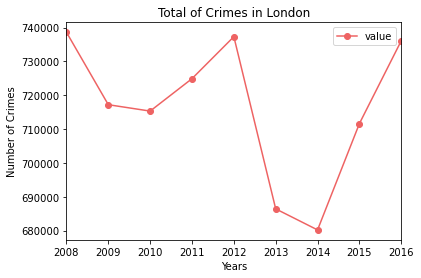

In [47]:
sum_per_year.plot(kind="line", marker='o', color="#EE6363")

plt.title("Total of Crimes in London")
plt.ylabel("Number of Crimes")
plt.xlabel("Years")

plt.show()

Membuat line plot untuk memvisualisasikan jumlah kejahatan per tahun dengan menggunakan plotly

In [48]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=sum_per_year.index.year,
                         y=sum_per_year.value,
                         mode="lines+markers",
                         line=dict(color="#EE6363")))
fig.update_layout(title="Number of Crimes by Year",
                  xaxis_title="Year",
                  yaxis_title="Number of Crimes")
fig.show()

**Kesimpulan:** Berdasarkan grafik di atas dapat disimpulkan bahwa jumlah kejahatan tertinggi terjadi pada tahun 2008, yaitu sebesar: 738.641 dan jumlah kejahatan terendah terjadi pada tahun 2014, yaitu sebesar 680.183. Oleh karena itu, dapat disimpulkan bahwa selisih antara kejahatan yang terjadi pada tahun tertinggi dan pada tahun terendah adalah 58.458.

# Pie Chart

## Berapakah persentase kejahatan yang terjadi pada tahun dengan jumlah kejahatan tertinggi?

Membuat pie chart untuk memvisualisasikan jumlah kejahatan per tahun menggunakan *matplotlib*

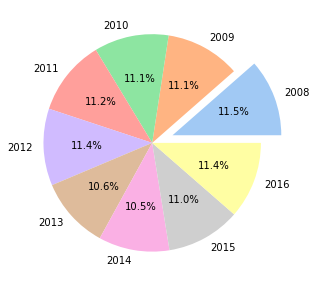

In [49]:
labels = df.resample("Y").sum()[["value"]].index.year
values = df.resample("Y").sum()[["value"]].value
colors = sns.color_palette("pastel")[:len(df.resample("Y").sum()[["value"]])]
explode = [0.2,0,0,0,0,0,0,0,0]

plt.figure(figsize=(5,5))
plt.pie(values, labels = labels, autopct = "%.1f%%", colors=colors, explode=explode)
plt.show() 

Membuat pie chart untuk memvisualisasikan jumlah kejahatan per tahun menggunakan *plotly*

In [50]:
labels = df.resample("Y").sum()[["value"]].index.year
values = df.resample("Y").sum()[["value"]].value

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.2,0,0,0,0,0,0,0,0], title= "Percentage of Crimes in London by Year", title_font_size=20, sort=False)])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

**Kesimpulan:** Berdasarkan output pie chart yang diperoleh, dapat disimpulkan bahwa persentase kejahatan yang terjadi pada tahun tertinggi adalah 11,5% yaitu pada tahun 2018.

# Area Chart

## Sebutkan 5 Kota Tertinggi Berdasarkan Jumlah Kejahatan!

Menjumlahkan kejahatan berdasarkan daerah lalu mengurutkannya dari yang tertinggi dan didefinisikan sebagai borough

In [51]:
top5_borough = df.groupby("borough").sum()[["value"]].sort_values("value",ascending=False).head().index
top5_borough

Index(['Westminster', 'Lambeth', 'Southwark', 'Camden', 'Newham'], dtype='object', name='borough')

Slicing dataset yang hanya berisi top 5 daerah dengan jumlah kejahatan tertinggi

In [52]:
top5 = df[df["borough"].isin(top5_borough)][["borough","value"]]
top5 = top5.groupby(["borough",top5.index.year]).sum()[["value"]].reset_index()
top5

,borough,date,value
0,Camden,2008,32010
1,Camden,2009,31612
2,Camden,2010,31804
3,Camden,2011,33956
4,Camden,2012,31472
5,Camden,2013,28435
6,Camden,2014,27198
7,Camden,2015,29477
8,Camden,2016,29183
9,Lambeth,2008,31717


Membuat area plot untuk memvisualisasikan top 5 daerah dengan kejahatan tertinggi

In [53]:
fig = px.area(top5, x="date", y="value", color="borough", title="Top 5 Boroughs with the Most Crimes in London")
fig.show()

**Kesimpulan:** Berdasarkan output area chart di atas, dapat disimpulkan bahwa 5 kota tertinggi berdasarkan jumlah kejahatan kategori utama adalah Camden, Lambeth, Newham, Southwark, dan Westminster.

# Scatter Plot

## Apakah jumlah kejahatan per bulan berdistribusi normal?

Membuat dataframe, yaitu *value_per_month* yang berisi jumlah kejahatan per bulan

In [54]:
value_per_month = df.resample("M").sum()
value_per_month.head()

,value
date,
2008-01-31,65419
2008-02-29,62626
2008-03-31,61343
2008-04-30,59640
2008-05-31,62587


Untuk membuat Q-Q plot kita perlu melakukan beberapa hal, yaitu:

- Mengurutkan value x<sub>(i)</sub> dari yang terkecil ke yang terbesar
- Menghitung nilai p<sub>(i)</sub> : $$p_{(i)} = \frac{i - \frac{1}{2}}{n}$$
- Menghitung nilai q<sub>(i)</sub> : $$P(z ≤ q_{(i)}) = \int_{-\infty}^{q_{(i)}} \frac{1}{\sqrt{2\pi}}e^{\frac{-z^2}{2}}dz$$

In [55]:
n = np.arange(1,len(value_per_month) + 1)
xn = np.sort(np.array(value_per_month["value"]))

pn = [(i - 0.5)/len(value_per_month) for i in n]
qn = [norm.ppf(i) for i in pn]

z = np.polyfit(qn,xn,1)
p = np.poly1d(z)

Membuat scatter plot (Q-Q plot) menggunakan *plotly* untuk mengecek apakah data berdistribusi normal secara visual dan menggunakan Jarque-Bera untuk mengecek apakah data berdistribusi normal secara formal

In [56]:
from scipy.stats import jarque_bera

fig = go.Figure()
fig.add_trace(go.Scatter(x=qn,y=xn,mode="markers",marker=dict(size=10),line=dict(color="blue"),name="Data"))
fig.add_trace(go.Scatter(x=qn,y=p(qn),mode="lines",line=dict(color="red"),name="Trend Line"))
fig.update_layout(title="Q-Q Plot",
                  xaxis_title=r"$q_{(i)}$",
                  yaxis_title=r"$x_{(i)}$")
fig.show()

for i,j in zip(["Jarque-Bera","Significance"],jarque_bera(value_per_month["value"])):
    print(f"{i}\t= {np.round(j,3)}")

Jarque-Bera	= 2.157
Significance	= 0.34


**Kesimpulan:** Berdasarkan output QQ-Plot di atas, secara visual dapat dilihat bahwa plot-plot mengikuti garis lurus sehingga dapat disimpulkan bahwa data berdistribusi normal. Lalu secara formal, diperoleh bahwa prob. Jarque-Bera = 0,34 > alfa = 0,05 sehingga dapat disimpulkan bahwa data berdistribusi normal. Oleh karena itu, asumsi normalitas secara visual dan formal terpenuhi. 

# Histogram dan Boxplot

## Buatlah persebaran jumlah kejahatan di daerah Lambeth dan Southwark!

Membuat histogram untuk melihat persebaran data dan membuat box plot untuk menampilkan descriptive statistics

In [57]:
crimes_month = []
for i in ["Lambeth","Southwark"]:
    crimes_month.append(df[df["borough"] == i].resample("M").sum())
    
for i,j in zip(crimes_month,["Lambeth","Southwark"]):
    i = i.insert(1,"borough",j)
    
new_crimes_month = pd.concat(crimes_month)
new_crimes_month = new_crimes_month.reset_index(drop=True)

fig = go.Figure()
fig = px.histogram(new_crimes_month,x="value",color="borough",barmode="stack",marginal="box")
fig.update_layout(title="Number of Crimes in Lambeth and Southwark by Month",
                  xaxis_title="Crimes",
                  yaxis_title="Count")
fig.show()

**Kesimpulan:** Berdasarkan Histogram di atas, dapat disimpulkan bahwa kejahatan di daerah Lambeth dan Southwark memiliki persebaran yang mirip dan pada box plot dapat dilihat descriptive statistics dari data

# Bar plot

## Bagaimana perbandingan antara jumlah kejahatan kategori utama terbanyak dengan kategori lainnya per tahun?

Menjumlahkan kejahatan berdasarkan major_category lalu mengurutkannya dari yang tertinggi dan diambil kejahatan kategori utama yang paling tinggi, yaitu: Theft and Handling

In [58]:
df.groupby("major_category").sum().sort_values("value",ascending=False).head(1)

,value
major_category,
Theft and Handling,2661861


Slicing kejahatan kategori utama lalu diambil Theft and Handling karena merupakan kejahatan tertinggi pada kategori utama. Lalu dijumlahkan berdasarkan tahun. Lalu mengubah menjadi array.

In [59]:
theft = df[df["major_category"] == "Theft and Handling"]
theft = theft.groupby(theft.index.year).sum()[["value"]]
theft = np.array(theft["value"])
theft

array([283692, 279492, 290924, 309292, 334054, 306372, 279880, 284022,
       294133], dtype=int64)

Slicing kejahatan kategori utama lalu diambil kejahatan selain Theft and Handling. Lalu dijumlahkan berdasarkan tahun. Lalu mengubahnya menjadi array

In [60]:
others = df[df["major_category"] != "Theft and Handling"]
others = others.groupby(others.index.year).sum()[["value"]]
others = np.array(others["value"])
others

array([454949, 437722, 424400, 415623, 403275, 380035, 400303, 427602,
       441988], dtype=int64)

Membuat Bar Plot untuk membandingkan antara jumlah kejahatan kategori utama terbanyak, yaitu Theft and Handling, dengan kategori lainnya per tahun

In [61]:
years = df.index.year.unique()

fig = go.Figure()
fig.add_trace(go.Bar(x=years,
                y=others,
                name='Other Major Crimes',
                marker_color='rgb(55, 83, 109)'
                ))
fig.add_trace(go.Bar(x=years,
                y=theft,
                name='Theft and Handling',
                marker_color='rgb(26, 118, 255)'
                ))

fig.update_layout(
    title='Theft and Handling vs Other Major Crimes',
    xaxis_tickfont_size=14,
    yaxis=dict(
        title='Number of Crimes',
        titlefont_size=16,
        tickfont_size=14,
    ),
    legend=dict(
        bgcolor='rgba(255, 255, 255, 0)',
        bordercolor='rgba(255, 255, 255, 0)'
    ),
    barmode='group',
    bargap=0.15,
    bargroupgap=0.1
)
fig.show()

**Kesimpulan:** Berdasarkan output Bar Plot di atas, dapat disimpulkan bahwa jumlah kejahatan tertinggi per tahun kategori utama adalah Theft and Handling dan jumlah frekuensinya tidak pernah melampaui total dari jumlah kejahatan lainnya

# Word Clouds

## Apakah kata yang paling sering muncul di kategori kejahatan utama pada tahun 2014?

Membuat word clouds untuk menemukan kata yang paling sering muncul di kategori kejahatan utama pada tahun 2014

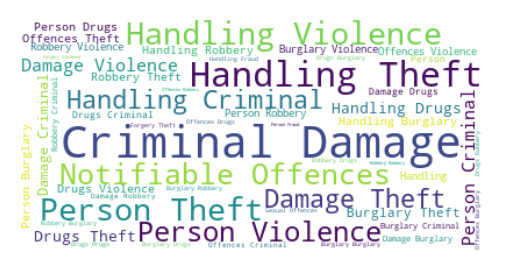

In [62]:
stopwords = set(STOPWORDS)

plt.figure(figsize=(3,3),dpi=200)
crimes_wordcloud = WordCloud(background_color="white",
                             stopwords=stopwords).generate(" ".join(df.loc["2014"]["major_category"]))
plt.imshow(crimes_wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

**Kesimpulan:** Berdasarkan word clouds di atas, dapat disimpulkan kata yang paling sering muncul di kategori kejahatan utama pada tahun 2014 adalah Criminal Damage, Handling Theft, dan Handling Violence

# Folium Maps dan Chloropleth Maps

## Bagaimana kejahatan di London secara menyeluruh?

Mengurutkan dataset berdasarkan kolom daerah dan didefinisikan sebagai sort_borough

In [63]:
sort_borough = df.sort_values("borough")
sort_borough.head()

,lsoa_code,borough,major_category,minor_category,value
date,,,,,
2008-01-01,E01000013,Barking and Dagenham,Burglary,Burglary in Other Buildings,3
2009-08-01,E01000079,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,1
2012-02-01,E01000022,Barking and Dagenham,Theft and Handling,Motor Vehicle Interference & Tampering,0
2013-11-01,E01000112,Barking and Dagenham,Theft and Handling,Theft From Shops,0
2013-11-01,E01000080,Barking and Dagenham,Criminal Damage,Criminal Damage To Dwelling,2


Mencari titik koordinat, yaitu latitude dan longitude di setiap daerah

In [64]:
geolocator = Nominatim(user_agent="MyApp")

lat = []
long = []

for i in sort_borough["borough"].unique():
    loc = geolocator.geocode(i, timeout=None)
    lat.append(loc.latitude)
    long.append(loc.longitude)

Split per daerah

In [65]:
split_borough = []
for i in sort_borough["borough"].unique():
    split = sort_borough[sort_borough["borough"] == i]
    split_borough.append(split)

Memasukkan titik koordinat ke daerah yang telah di-split

In [66]:
for i,j,k in zip(split_borough,lat,long):
    i.insert(5,"latitude",j)
    i.insert(6,"longitude",k)

Menggabungkan dataset yang telah di-split dan mengurutkan berdasarkan date index

In [67]:
borough_loc = pd.concat(split_borough).sort_index()
borough_loc.head()

,lsoa_code,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,,
2008-01-01,E01000013,Barking and Dagenham,Burglary,Burglary in Other Buildings,3,51.554091,0.150489
2008-01-01,E01003839,Richmond upon Thames,Theft and Handling,Handling Stolen Goods,0,51.440553,-0.307639
2008-01-01,E01000517,Brent,Drugs,Possession Of Drugs,0,51.563996,-0.275906
2008-01-01,E01003814,Richmond upon Thames,Robbery,Personal Property,0,51.440553,-0.307639
2008-01-01,E01000505,Brent,Violence Against the Person,Harassment,0,51.563996,-0.275906


Untuk mengurangi computational cost, maka diambil 10.000 sample dari dataset

In [68]:
n_sample = 10000

borough_loc_2008 = borough_loc.loc["2008"]
borough_loc_2008 = borough_loc_2008.sample(n=n_sample,random_state=1221,axis=0)
borough_loc_2008.head()

,lsoa_code,borough,major_category,minor_category,value,latitude,longitude
date,,,,,,,
2008-07-01,E01004283,Tower Hamlets,Robbery,Business Property,0,51.128863,1.298669
2008-10-01,E01001436,Enfield,Criminal Damage,Criminal Damage To Motor Vehicle,0,51.652085,-0.081018
2008-07-01,E01000815,Bromley,Violence Against the Person,Common Assault,0,51.402805,0.014814
2008-11-01,E01003940,Southwark,Violence Against the Person,Offensive Weapon,1,51.502922,-0.103458
2008-05-01,E01002128,Harrow,Burglary,Burglary in Other Buildings,0,51.596827,-0.337305


Mencari titik koordinat di London

In [69]:
london = geolocator.geocode("London")

print(f"London's latitude\t:{london.latitude}")
print(f"London's longitude\t:{london.longitude}")

London's latitude	:51.5073219
London's longitude	:-0.1276474


Membuat folium map untuk menampilkan kejahatan yang terjadi di London secara umum

In [70]:
london_crimes_map = folium.Map(location=[london.latitude,london.longitude],zoom_start=10)

london_crimes = plugins.MarkerCluster().add_to(london_crimes_map)

for i,j,k in zip(borough_loc_2008["latitude"],borough_loc_2008["longitude"],borough_loc_2008["major_category"]):
    folium.Marker(
        location=[i,j],
        icon=None,
        popup=k
    ).add_to(london_crimes)

london_crimes_map

Download GeoJSON file yang mendefinisikan daerah di London

In [71]:
with urlopen("https://skgrange.github.io/www/data/london_boroughs.json") as response:
    london_boroughs = json.load(response)

Mengambil ID untuk tiap daerah dari GeoJSON file

In [72]:
boroughs_id = {}
for i in london_boroughs["features"]:
    i["id"] = i["properties"]["id"]
    boroughs_id[i["properties"]["name"]] = i["id"]

Menambahkan ID ke dataframe

In [73]:
borough_crimes = df.groupby("borough").sum()[["value"]].reset_index()
borough_crimes["id"] = borough_crimes["borough"].apply(lambda x: boroughs_id[x])
borough_crimes.head()

,borough,value,id
0,Barking and Dagenham,149447,32
1,Barnet,212191,10
2,Bexley,114136,15
3,Brent,227551,9
4,Bromley,184349,3


Membuat Chloropleth Maps untuk memvisualisasikan jumlah kejahatan di London pada tahun 2008

In [74]:
fig = go.Figure()
fig = px.choropleth_mapbox(
    borough_crimes,
    geojson=london_boroughs,
    locations="id",
    mapbox_style="open-street-map",
    center={"lat":london.latitude,"lon":london.longitude},
    hover_name="borough",
    color="value",
    color_continuous_scale="pubu",
    labels={"id":"ID","value":"Number of Crimes"},
    zoom=8.7
)
fig.update_layout(margin={"r":0,"l":0,"b":0},title="Number of Crimes at London in 2008",title_x=0.5)
fig.show()

**Kesimpulan:** Berdasarkan map di atas, dapat disimpulkan bahwa jumlah kejahatan tertinggi yaitu 455.028 yang terjadi di Westminster dan jumlah kejahatan terendah yaitu 780 yang terjadi di City of London